## Topic 1: Introduction to Neural Machine Translation & The Problem with Basic Encoder-Decoder

---

### 1. Introduction

**What it is:**  
Neural Machine Translation (NMT) is the task of using deep learning (neural networks) to automatically translate a sentence from one language (e.g., English) into another (e.g., Hindi).

**Why it's important:**  
This is the technology behind tools like Google Translate. Understanding its evolution helps us see why modern AI systems (like Transformers) are built the way they are.

**Real‑life use:**  
Any app or website that offers automatic translation—from social media posts to entire web pages—uses some form of NMT.

---

### 2. Detailed Explanation

#### The Basic Approach: Encoder‑Decoder Architecture
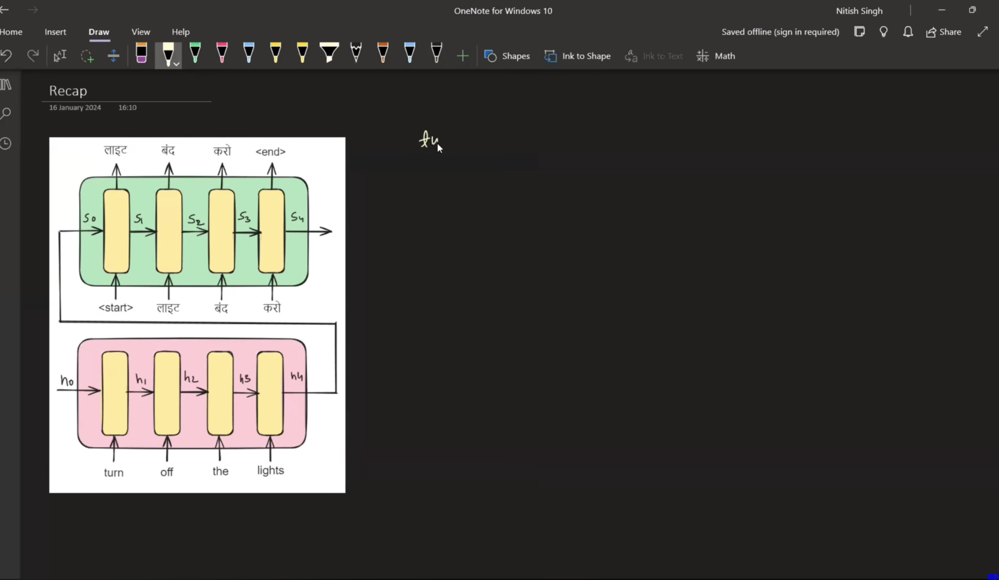
The first neural network used for translation was the **encoder‑decoder** model.

- **Encoder:**  
  - Takes the input sentence word by word (e.g., "turn", "off", "the", "lights").  
  - Processes them through an LSTM (a type of recurrent neural network).  
  - Its job is to compress the *entire* input sentence into a single **context vector** – a fixed set of numbers that acts as a "summary" or "representation" of the whole sentence.

- **Decoder:**  
  - Receives that one context vector.  
  - Uses it to generate the translated sentence word by word (e.g., "light", "band", "off" – Hindi translation).

> **Analogy:** Imagine you are asked to summarise a whole movie in one sentence. Then, someone uses only that sentence to recreate the full script. You will lose many details. The encoder‑decoder does something similar with longer sentences.

#### The Bottleneck (The Problem)

When sentences grow longer than about 30 words, the quality of translation drops sharply.

- Why? Because the single context vector (a fixed set of numbers) cannot hold all the details of a long sentence or a paragraph.
- The decoder only gets this one summary, so it struggles to generate accurate words for longer inputs.
- This was a major bottleneck in the system.

---

### 3. Key Points

| Concept | Explanation |
|---------|-------------|
| **Neural Machine Translation (NMT)** | Using neural networks to translate between languages. |
| **Encoder** | Reads the input sentence and creates a summary (context vector). |
| **Decoder** | Takes that summary and generates the output translation. |
| **Context Vector** | A fixed‑size numeric representation of the *entire* input sentence. |
| **Bottleneck** | The context vector cannot capture long or complex sentences well, causing poor translations. |

---

### 4. Common Mistakes

- **Mistake:** Thinking the encoder passes each word individually to the decoder.  
  **Correction:** The encoder passes *only* the final context vector (the summary), not individual hidden states.

- **Mistake:** Assuming the context vector grows with sentence length.  
  **Correction:** It is fixed in size, which is exactly why long sentences lose information.

---

### 5. Interview/Exam Questions

**Q1:** What is the main limitation of the basic encoder‑decoder architecture for machine translation?  
**A1:** It uses a single fixed‑size context vector to represent the entire input. For long sentences, this vector cannot retain enough information, leading to poor translation quality.

**Q2:** Why does the context vector cause a bottleneck?  
**A2:** Because it has a limited capacity. As sentence length increases, the information needed to translate accurately exceeds what can be compressed into that fixed vector.

---

### 6. Revision Notes

- **NMT** = neural network translation.
- **Encoder** → reads input → produces one **context vector**.
- **Decoder** → uses that vector → outputs translation word by word.
- **Problem:** Long sentences → context vector is too small → poor translation.
- **Solution (next topic):** Attention Mechanism – which gives the decoder access to *all* hidden states, not just one summary.

---

**That's the end of the first topic.**  


## Topic 2: The Attention Mechanism – Core Idea & Weighted Sum
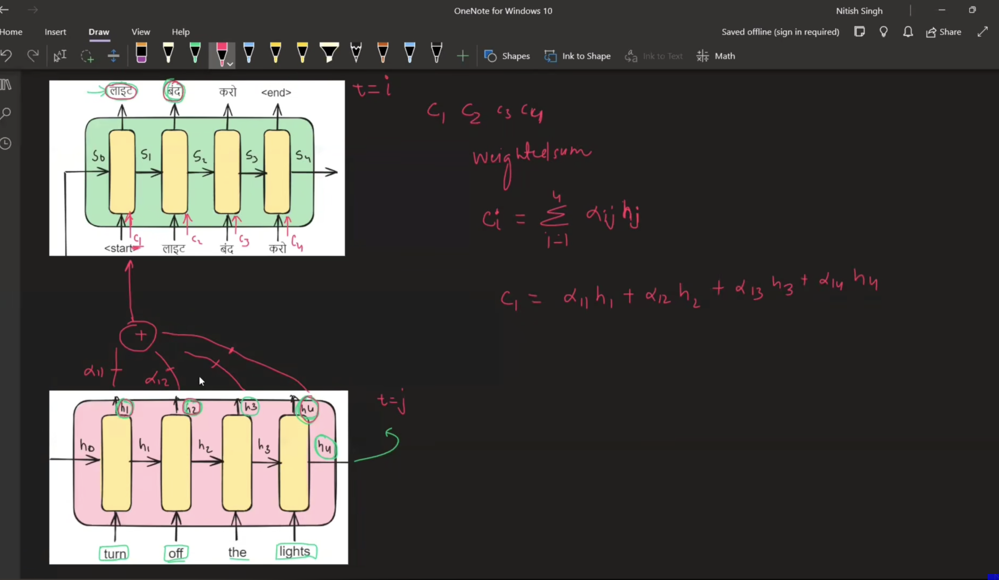
---

### 1. Introduction

**What it is:**  
The **Attention Mechanism** is a smarter way for the decoder to translate. Instead of relying on a single summary (context vector) of the whole input, attention lets the decoder *look back* at every word of the input at each step and decide which words are most relevant for the current word it wants to produce.

**Why it's important:**  
Attention solved the bottleneck of long sentences. It dramatically improved translation quality and became the foundation for modern models like Transformers.

**Real‑life use:**  
Every advanced translation system, speech recognition, and even image captioning uses some form of attention. It helps the model "focus" on the right parts of the input.

---

### 2. Detailed Explanation

#### The Core Idea

Instead of passing one context vector from encoder to decoder, the attention mechanism does this:

- The encoder still processes the sentence and produces a **hidden state** for each word:  
  `h1, h2, h3, h4` (for "turn", "off", "the", "lights").

- These hidden states are *all kept* and made available to the decoder at **every time step**.

- At each decoding step (e.g., when printing "light"), the decoder dynamically chooses which of these hidden states are most useful. It does this by calculating a **weighted sum** of all encoder hidden states.

#### The Weighted Sum Formula

For decoding step **i**, the context vector **cᵢ** is:

```
cᵢ = αᵢ₁·h₁ + αᵢ₂·h₂ + αᵢ₃·h₃ + αᵢ₄·h₄
```

- **α (alpha)** = weight/importance score for each encoder hidden state.
- The weights are called **alignment scores** – they tell us how well each input word "aligns" with the current output word.

> **Analogy:** Imagine you're translating a sentence and you're stuck on the word "lights". You look back at the original sentence. Instead of reading the whole sentence again, you focus your attention mainly on the word "lights" (and maybe "the"). That is what attention does – it gives higher weight to the relevant words.

#### Example (from the transcript)

- To print "light", the decoder might assign:
  - High weight to `h4` (which came from "lights")  
  - Low weight to `h1` (which came from "turn")

- To print "off", it might assign high weights to `h1` ("turn") and `h2` ("off").

#### How Many Weights?

If the input has 4 words and the output has 4 words, we need to calculate:  
**4 × 4 = 16** alignment scores (α values).

In general:  
**Number of alphas = (input length) × (output length)**

---

### 3. Key Points

| Term | Meaning |
|------|---------|
| **Encoder hidden states (hⱼ)** | The output of the encoder at each word position. |
| **Decoder step (i)** | The current word being generated in the output. |
| **Context vector (cᵢ)** | A new, dynamically computed summary for each output step. |
| **Alignment score (αᵢⱼ)** | A weight that tells how important encoder word j is for decoder word i. |
| **Weighted sum** | The method to combine hidden states using alignment scores. |

---

### 4. Syntax / Structure (Formula)

The general formula for the context vector at decoder time step **i**:

```
cᵢ = Σⱼ αᵢⱼ · hⱼ
```

Where:
- `Σⱼ` = sum over all encoder positions j.
- `αᵢⱼ` = alignment score (weight) for encoder state j at decoder step i.
- `hⱼ` = hidden state of encoder at position j.

---

### 5. Code Example (Conceptual – not in transcript, but logically derived)

```python
# Assume encoder hidden states: h = [h1, h2, h3, h4]
# Assume alignment scores for current decoder step: alpha = [0.1, 0.2, 0.6, 0.1]

# Weighted sum to compute context vector c
c = 0
for j in range(4):
    c += alpha[j] * h[j]

# Result: c is a context vector that heavily focuses on h3 (weight 0.6)
```

**Explanation:**  
- `alpha[2] = 0.6` means the third encoder word (index 2) is considered most important for the current output word.  
- The weighted sum combines all hidden states but emphasises the one with the largest weight.

---

### 6. Common Mistakes

- **Mistake:** Thinking attention replaces the encoder.  
  **Correction:** The encoder still works as before – it produces hidden states. Attention is a *mechanism* that uses those states differently.

- **Mistake:** Believing the decoder only uses one hidden state at a time.  
  **Correction:** The decoder uses *all* hidden states at *every* step, but weighted differently.

- **Mistake:** Forgetting that weights (α) sum to 1.  
  **Correction:** The weights are normalised (e.g., using softmax) so they add up to 1. This turns them into a probability distribution over input words.

---

### 7. Interview/Exam Questions

**Q1:** How does the attention mechanism solve the bottleneck problem of the basic encoder‑decoder?  
**A1:** Instead of using one fixed context vector, attention computes a new context vector at every decoder step by taking a weighted sum of all encoder hidden states. This lets the decoder focus on the most relevant input words at each step.

**Q2:** What does the alignment score αᵢⱼ represent?  
**A2:** It represents how important the j‑th encoder hidden state is for producing the i‑th output word. Higher weight means stronger "alignment" or relevance.

**Q3:** If the input has 5 words and the output has 7 words, how many alignment scores are needed?  
**A3:** 5 × 7 = 35 scores.

---

### 8. Revision Notes

- **Attention** = dynamic context vector per decoder step.
- **Context vector** = weighted sum of all encoder hidden states.
- **Weights (α)** = alignment scores – measure relevance of each input word.
- **Formula:** `cᵢ = Σ αᵢⱼ · hⱼ`
- More weights needed for longer sentences, but that's okay – the model learns which to focus on.

---

**That's the end of the second topic.**  


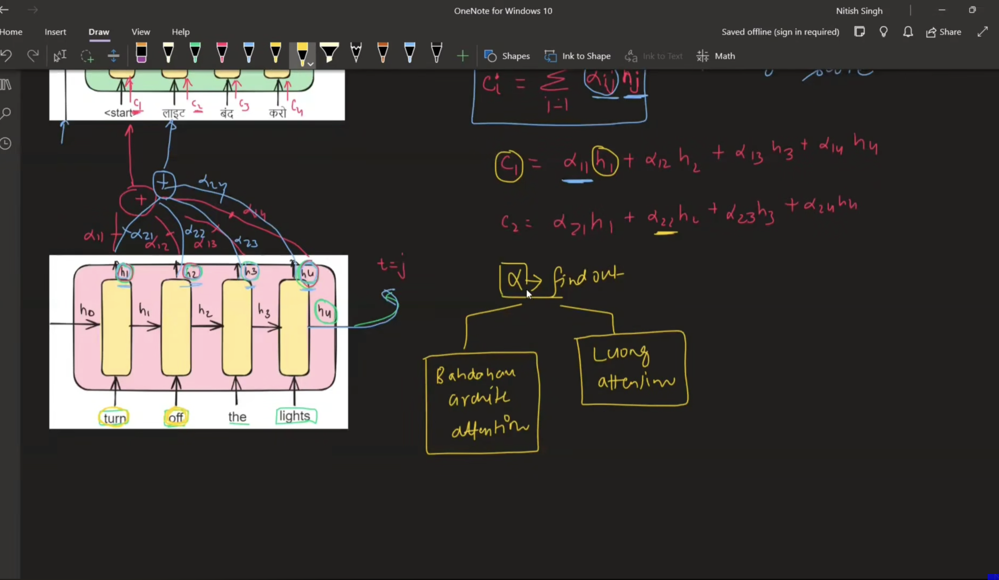

## Topic 3: Bahdanau Attention (Additive Attention) – Detailed Architecture

---

### 1. Introduction

**What it is:**  
Bahdanau Attention (also called **Additive Attention**) is the first major attention mechanism proposed for neural machine translation. It introduced the idea of using a **feedforward neural network** to calculate alignment scores (α values) dynamically.

**Why it's important:**  
This was the breakthrough that made attention work in practice. It showed that you don't need to hand‑design a similarity function – you can let a neural network *learn* the best way to align input and output words.

**Real‑life use:**  
Bahdanau attention was used in early advanced translation systems and laid the groundwork for all modern attention-based models, including Transformers.

---

### 2. Detailed Explanation

#### What We Need to Compute

We need alignment scores `αᵢⱼ` – the importance of encoder hidden state `hⱼ` when generating decoder output at step `i`.

Bahdanau's key insight: **αᵢⱼ depends on two things:**

1. **Encoder hidden state (hⱼ)** – the word we're checking.  
2. **Previous decoder hidden state (sᵢ₋₁)** – the context of what has been translated so far.

> **Why the previous decoder state?**  
> The importance of an input word isn't fixed – it depends on what you've already printed. For example, to translate "lights", you need to know you're already past "turn" and "off". That "past context" is stored in `sᵢ₋₁`.

#### How Bahdanau Computes α

Instead of inventing a mathematical formula, Bahdanau says:  
**Let a neural network learn this relationship.**

The steps (for a single alignment score `αᵢⱼ`):

1. Take `sᵢ₋₁` (previous decoder state) and `hⱼ` (current encoder state).
2. **Concatenate** them into one combined vector.
3. Pass this vector through a **feedforward neural network** (one hidden layer).
4. The network outputs a raw score `eᵢⱼ` (unnormalised alignment).
5. Apply **softmax** across all `j` values to get normalised weights `αᵢⱼ`.

#### The Neural Network Inside the Decoder

- The network has:
  - Input layer: takes the concatenated vector `[sᵢ₋₁; hⱼ]`.
  - One hidden layer (e.g., 3 units).
  - Output layer: one unit that produces `eᵢⱼ`.
- The weights of this network are **shared** across all decoder time steps – it's called a **time‑distributed** network.

---

### 3. Step‑by‑Step Walkthrough (For 4‑word sentence)

**Step 1: Encode the input**  
- Send "turn" → get `h1`  
- Send "off" → get `h2`  
- Send "the" → get `h3`  
- Send "lights" → get `h4`

**Step 2: Decoder step 1 (i=1)**  
- Use initial decoder state `s₀` (usually zero or random).  
- Concatenate `s₀` with `h1`, `h2`, `h3`, `h4` separately → form a matrix (4 rows, 8 columns if each vector is 4‑dim).  
- Pass each row through the neural network → get raw scores `e₁₁, e₁₂, e₁₃, e₁₄`.  
- Apply softmax → get `α₁₁, α₁₂, α₁₃, α₁₄` (they sum to 1).  
- Compute `c₁ = α₁₁h₁ + α₁₂h₂ + α₁₃h₃ + α₁₄h₄`.  
- Use `s₀`, `y₀` (start token), and `c₁` as input to the decoder LSTM → produces first output word ("light") and new state `s₁`.

**Step 3: Decoder step 2 (i=2)**  
- Now use `s₁` (previous state) instead of `s₀`.  
- Concatenate `s₁` with `h1...h4` again → matrix (4×8).  
- Pass through the **same neural network** (same weights).  
- Get `e₂₁...e₂₄` → softmax → `α₂₁...α₂₄`.  
- Compute `c₂`.  
- Decode next word.

This repeats until the end-of-sentence token is generated.

---

### 4. Mathematical Formulation (3 Key Equations)

Bahdanau attention is summarised by these three equations:

1. **Context vector:**  
   `cᵢ = Σⱼ αᵢⱼ · hⱼ`

2. **Alignment scores (α):**  
   `αᵢⱼ = softmax(eᵢⱼ)` = `exp(eᵢⱼ) / Σₖ exp(eᵢₖ)`

3. **Raw score (e):**  
   `eᵢⱼ = vᵀ · tanh(W · [sᵢ₋₁; hⱼ] + b)`  
   - `[sᵢ₋₁; hⱼ]` = concatenation.  
   - `W` = weight matrix for the hidden layer.  
   - `v` = weight vector for the output layer.  
   - `tanh` = activation function.  
   - `b` = bias.

---

### 5. Key Terminology

| Term | Meaning |
|------|---------|
| **Additive Attention** | Another name for Bahdanau (because it adds/composes information through a network). |
| **Alignment Model** | The feedforward neural network that computes `eᵢⱼ`. |
| **Time‑distributed** | The same alignment model is reused at every decoder step (weights are shared). |
| **Concatenation** | Joining two vectors end‑to‑end to form a longer vector. |

---

### 6. Code Example (Conceptual)

```python
import numpy as np

# Example vectors (4-dimensional)
s_prev = np.array([0.1, 0.2, 0.3, 0.4])   # previous decoder state
h_j    = np.array([0.5, 0.6, 0.7, 0.8])   # one encoder state

# Step 1: Concatenate
concat = np.concatenate([s_prev, h_j])    # length 8

# Step 2: Pass through a simple neural network (conceptual)
# Assume learned weights W (8x3), v (3x1), and bias b
W = np.random.randn(8, 3)
v = np.random.randn(3, 1)
b = 0

hidden = np.tanh(np.dot(concat, W) + b)   # shape (3,)
e_ij = np.dot(hidden, v)                  # scalar raw score

# Step 3: Apply softmax over all j (not shown here)
# After softmax, we get alpha_ij
```

---

### 7. Common Mistakes

- **Mistake:** Thinking the alignment network is separate from the decoder.  
  **Correction:** It is actually *inside* the decoder and trained end‑to‑end with everything else.

- **Mistake:** Believing the weights of the alignment model change at every step.  
  **Correction:** The weights are the **same** across all time steps. Only the input (different `sᵢ₋₁`) changes.

- **Mistake:** Confusing `eᵢⱼ` (raw score) with `αᵢⱼ` (normalised weight).  
  **Correction:** `α` comes *after* applying softmax to `e`. The softmax ensures all weights sum to 1.

---

### 8. Interview/Exam Questions

**Q1:** What two inputs does Bahdanau attention use to compute alignment scores?  
**A1:** The previous decoder hidden state (`sᵢ₋₁`) and the current encoder hidden state (`hⱼ`).

**Q2:** Why use a neural network instead of a fixed function like dot product?  
**A2:** A neural network can learn a complex, task‑specific alignment function from data, potentially capturing non‑linear relationships that a simple function might miss.

**Q3:** What does "time‑distributed" mean in the context of Bahdanau attention?  
**A3:** It means the same feedforward network (with the same weights) is applied at every decoder time step, just with different inputs.

**Q4:** Write the equation for `eᵢⱼ` in Bahdanau attention.  
**A4:** `eᵢⱼ = vᵀ · tanh(W · [sᵢ₋₁; hⱼ] + b)`

---

### 9. Revision Notes

- **Bahdanau = Additive Attention**  
- Uses a **feedforward neural network** to compute alignment scores.  
- Alignment score depends on **previous** decoder state `sᵢ₋₁` and encoder state `hⱼ`.  
- Steps: concatenate → neural network → raw score `e` → softmax → `α` → weighted sum → `cᵢ`.  
- Same network reused at every decoder step (time‑distributed).  
- This was the first working attention model and inspired all later versions.

---

**That's the end of the third topic.**  


## Topic 4: Luong Attention (Multiplicative Attention) – Detailed Architecture

---
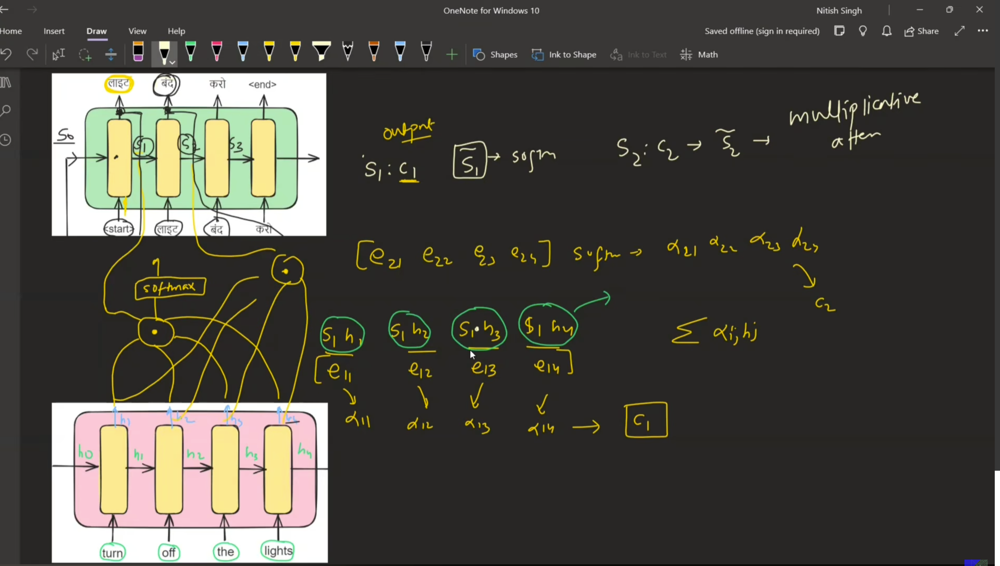
### 1. Introduction

**What it is:**  
Luong Attention (also called **Multiplicative Attention**) is a simplified and faster alternative to Bahdanau attention. It was proposed later and introduced two key improvements: using the **current** decoder hidden state instead of the previous one, and using a simple **dot product** instead of a neural network to calculate alignment scores.

**Why it's important:**  
Luong attention is more efficient (fewer parameters) and often gives better results. It bridges the gap between additive attention and the even simpler self-attention used in Transformers.

**Real‑life use:**  
Luong-style attention (especially the dot-product variant) is widely used in sequence-to-sequence models, and its concepts directly inspired the scaled dot‑product attention in Transformers.

---

### 2. Detailed Explanation

#### The Two Key Differences from Bahdanau

| Aspect | Bahdanau | Luong |
|--------|----------|-------|
| **Decoder state used** | Previous (`sᵢ₋₁`) | **Current** (`sᵢ`) |
| **Alignment function** | Neural network (additive) | **Dot product** (multiplicative) |

#### Why Use the Current Decoder State?

- In Bahdanau, you compute attention *before* generating the current word, using only the past context.
- In Luong, you first generate a tentative current state `sᵢ` using the decoder LSTM (without context), and *then* compute attention based on that more up‑to‑date state.
- This gives the model a "fresh" view of what it's about to say, leading to more dynamic and accurate alignments.

#### Why Use Dot Product?

- The neural network in Bahdanau adds many parameters → slower training and inference.
- Dot product is a simple, fast, and mathematically meaningful similarity measure:  
  - If two vectors are similar (point in the same direction), their dot product is **large**.  
  - If they are dissimilar, the dot product is **small** (or negative).
- This removes the need for a learned alignment network entirely.

---

### 3. Step‑by‑Step Architecture Walkthrough

**Setup:** Encoder produces hidden states `h1, h2, h3, h4` as before.

**Decoder Step 1 (i=1):**

1. Take initial decoder state `s₀` and start token, pass through LSTM → produce **current** state `s₁`.

2. Now compute attention using `s₁`:
   - Compute raw scores:  
     `e₁ⱼ = dot(s₁, hⱼ)` for j = 1..4  
     → gives `e₁₁, e₁₂, e₁₃, e₁₄`
   - Apply softmax → `α₁₁, α₁₂, α₁₃, α₁₄`
   - Compute context vector:  
     `c₁ = Σⱼ α₁ⱼ · hⱼ`

3. **Crucial difference from Bahdanau:**  
   - In Bahdanau, `c₁` is fed *into* the LSTM to help produce `s₁`.  
   - In Luong, `c₁` is fed *after* the LSTM:  
     concatenate `[s₁; c₁]`, pass through a feedforward network, then softmax to produce the output word "light".

**Decoder Step 2 (i=2):**

1. Use `s₁` and previous output to update LSTM → get `s₂`.
2. Compute dot products: `e₂ⱼ = dot(s₂, hⱼ)` → softmax → `α₂ⱼ` → `c₂`.
3. Concatenate `[s₂; c₂]` → feedforward → softmax → output next word.

This repeats for each output word.

---

### 4. Mathematical Formulation

Luong attention is much simpler mathematically:

1. **Raw alignment score:**  
   `eᵢⱼ = sᵢᵀ · hⱼ`  
   (dot product of current decoder state and encoder state)

2. **Normalised alignment weights:**  
   `αᵢⱼ = softmax(eᵢⱼ)` = `exp(eᵢⱼ) / Σₖ exp(eᵢₖ)`

3. **Context vector:**  
   `cᵢ = Σⱼ αᵢⱼ · hⱼ`  
   (same as Bahdanau)

4. **Output combination:**  
   `tilde{sᵢ} = tanh(W_c · [sᵢ; cᵢ])`  
   (concatenation followed by a linear layer and tanh activation)

5. **Final output:**  
   `yᵢ = softmax(W_out · tilde{sᵢ})`

---

### 5. Comparison Table: Bahdanau vs Luong

| Feature | Bahdanau (Additive) | Luong (Multiplicative) |
|---------|---------------------|------------------------|
| **Decoder state** | Previous (`sᵢ₋₁`) | Current (`sᵢ`) |
| **Alignment function** | Neural network (`vᵀ tanh(W[...] + b)`) | Dot product (`sᵢᵀ hⱼ`) |
| **Parameters** | More (network weights) | Fewer (no alignment network) |
| **Speed** | Slower | Faster |
| **Context vector usage** | Fed *into* LSTM | Fed *after* LSTM (concatenated with output) |
| **Also known as** | Additive Attention | Multiplicative Attention |

---

### 6. Code Example (Conceptual)

```python
import numpy as np

# Assume decoder current state s_i and encoder states h = [h1, h2, h3, h4]
s_i = np.array([0.2, 0.3, 0.4, 0.5])   # current decoder state
h = np.array([
    [0.1, 0.2, 0.3, 0.4],   # h1
    [0.5, 0.6, 0.7, 0.8],   # h2
    [0.9, 1.0, 1.1, 1.2],   # h3
    [1.3, 1.4, 1.5, 1.6]    # h4
])

# Step 1: Compute raw scores (dot product)
e = np.dot(h, s_i)   # shape (4,) -> [e1, e2, e3, e4]

# Step 2: Apply softmax to get alpha
exp_e = np.exp(e)
alpha = exp_e / np.sum(exp_e)   # shape (4,)

# Step 3: Compute context vector (weighted sum)
c = np.sum(alpha[:, None] * h, axis=0)   # shape (4,)

# Step 4: Combine s_i and c (conceptual)
combined = np.concatenate([s_i, c])   # shape (8,)
# Pass through feedforward layer and softmax to get output word
```

---

### 7. Common Mistakes

- **Mistake:** Thinking Luong uses the *previous* state like Bahdanau.  
  **Correction:** Luong explicitly uses the **current** decoder state `sᵢ`, computed before attention.

- **Mistake:** Believing Luong still has a neural network for alignment.  
  **Correction:** The alignment is just a dot product – no extra network is used.

- **Mistake:** Confusing where the context vector goes.  
  **Correction:** In Bahdanau, `cᵢ` goes into the LSTM input. In Luong, `cᵢ` is combined with `sᵢ` *after* the LSTM to compute the output.

- **Mistake:** Assuming dot product only works if vectors are same size.  
  **Correction:** Yes, `sᵢ` and `hⱼ` must have the same dimensionality for dot product. In practice, they are designed to match.

---

### 8. Interview/Exam Questions

**Q1:** What are the two main differences between Luong attention and Bahdanau attention?  
**A1:** (1) Luong uses the **current** decoder hidden state `sᵢ` instead of the previous `sᵢ₋₁`. (2) Luong uses a **dot product** to compute alignment scores instead of a feedforward neural network.

**Q2:** Why is Luong attention called "multiplicative" attention?  
**A2:** Because the alignment score is computed by multiplying (dot product) the decoder state and encoder state, unlike Bahdanau which uses addition/composition through a network (additive).

**Q3:** What is the advantage of using dot product over a neural network for alignment?  
**A3:** It has far fewer parameters, making the model faster to train and run, while still capturing similarity effectively.

**Q4:** In Luong attention, when is the context vector used?  
**A4:** After the LSTM produces the current state `sᵢ`. The context vector `cᵢ` is concatenated with `sᵢ`, passed through a feedforward layer, and then used to generate the output word.

---

### 9. Revision Notes

- **Luong = Multiplicative Attention**  
- Uses **current** decoder state `sᵢ` (not previous).  
- Alignment = **dot product** `sᵢᵀ hⱼ` (no neural network).  
- Faster and has fewer parameters than Bahdanau.  
- Context vector is used **after** the LSTM, not as input to it.  
- Often performs better experimentally due to more up‑to‑date information.  
- This style is a direct predecessor to the attention used in Transformers.

---

**That's the end of the fourth topic.**  


## Topic 5: Summary, Comparison, and Why This Matters for Transformers

---

### 1. Introduction

**What it is:**  
A comprehensive recap of both attention mechanisms, their differences, and why we studied them. The ultimate goal is to build a strong foundation for understanding **self‑attention**, the core of Transformer models.

**Why it's important:**  
The Transformer is the basis of modern AI (GPT, BERT, etc.). Its self‑attention mechanism is a direct evolution of the ideas we've covered. By understanding Bahdanau and Luong, you will grasp Transformers much faster and more deeply.

**Real‑life use:**  
Every Large Language Model (LLM) like ChatGPT, Claude, or Gemini relies on self‑attention. The concepts you've learned here are the stepping stones to those systems.

---

### 2. Detailed Comparison: Bahdanau vs Luong

| Aspect | Bahdanau (Additive) | Luong (Multiplicative) |
|--------|---------------------|------------------------|
| **Year** | 2014 | 2015 |
| **Decoder state used** | Previous (`sᵢ₋₁`) | Current (`sᵢ`) |
| **Alignment function** | Feedforward neural network | Dot product |
| **Formula for raw score** | `eᵢⱼ = vᵀ tanh(W[sᵢ₋₁; hⱼ] + b)` | `eᵢⱼ = sᵢᵀ · hⱼ` |
| **Number of parameters** | More (network weights) | Fewer (no alignment network) |
| **Computational speed** | Slower | Faster |
| **Context vector usage** | Fed *into* the LSTM (as input) | Fed *after* the LSTM (concatenated with output) |
| **Also known as** | Additive Attention | Multiplicative Attention |
| **Performance** | Good, but slower | Often better and faster |

---

### 3. Why Both Exist and Which to Use

- **Bahdanau** was the *first* successful attention mechanism. It proved that dynamic alignment works and opened the door for all subsequent research.
- **Luong** simplified and improved it, showing that you don't need a complex network – a simple dot product is often enough.
- In practice, Luong is more commonly used today because of its efficiency and simplicity.
- However, studying both gives you a complete picture of how attention evolved.

---

### 4. How This Connects to Transformers

This is the most important part of the entire transcript.

**What is a Transformer?**  
A Transformer is a neural network architecture that processes entire sequences at once, using **self‑attention** instead of recurrent layers (like LSTMs).

**What is Self‑Attention?**  
- In Bahdanau and Luong, attention is between **two different sequences**: encoder states and decoder states (cross‑attention).
- In Transformers, attention is applied **within the same sequence**: every word looks at every other word in the same sentence to understand context.
- This is called **self‑attention** (or intra‑attention).

**How Bahdanau/Luong Inspired Self‑Attention:**

| Idea from Bahdanau/Luong | How it appears in Transformers |
|---------------------------|--------------------------------|
| Compute alignment scores between vectors | Self‑attention computes scores between all pairs of words in the input. |
| Use weighted sum to create a context vector | Self‑attention creates a weighted sum of all word representations for each word. |
| Softmax to normalise weights | Same softmax operation is used. |
| Luong's dot‑product similarity | Transformers use **scaled dot‑product attention** (dot product + scaling). |
| The concept of "focusing" on relevant parts | Self‑attention lets each word focus on the most relevant other words. |

**Key takeaway:**  
If you understand how `αᵢⱼ` is computed and used to form `cᵢ`, you already understand the core of self‑attention. The only difference is that in Transformers, the query, key, and value come from the *same* sequence, and the operation is done in parallel for all positions.

---

### 5. Summary of Key Formulas

**Bahdanau (Additive):**
```
eᵢⱼ = vᵀ · tanh(W · [sᵢ₋₁; hⱼ] + b)
αᵢⱼ = exp(eᵢⱼ) / Σₖ exp(eᵢₖ)
cᵢ = Σⱼ αᵢⱼ · hⱼ
```

**Luong (Multiplicative):**
```
eᵢⱼ = sᵢᵀ · hⱼ
αᵢⱼ = exp(eᵢⱼ) / Σₖ exp(eᵢₖ)
cᵢ = Σⱼ αᵢⱼ · hⱼ
```

**Both share the same context vector formula – only the way they compute `eᵢⱼ` differs.**

---

### 6. Quick Comparison Table

| Feature | Bahdanau | Luong |
|---------|----------|-------|
| **Type** | Additive | Multiplicative |
| **State used** | `sᵢ₋₁` | `sᵢ` |
| **Score computation** | Neural network | Dot product |
| **Parameters** | High | Low |
| **Speed** | Slow | Fast |
| **Context vector position** | LSTM input | LSTM output |
| **Better for** | Early experiments | Production / modern use |

---

### 7. Common Mistakes to Avoid

- **Mistake:** Thinking these two are completely different mechanisms.  
  **Correction:** They are variants of the same core idea – only the way of calculating alignment scores changes.

- **Mistake:** Believing Transformers don't use any of this.  
  **Correction:** Transformers directly inherit the dot‑product attention from Luong and the weighted‑sum/softmax framework from both.

- **Mistake:** Forgetting that self‑attention is between *all* positions in the *same* sequence, not between two different sequences.  
  **Correction:** That is the key shift: from cross‑attention (encoder‑decoder) to self‑attention (within one sequence).

---

### 8. Interview/Exam Questions

**Q1:** What is the fundamental difference between Bahdanau attention and Luong attention?  
**A1:** Bahdanau uses a feedforward neural network and the previous decoder state to compute alignment scores, while Luong uses dot product and the current decoder state.

**Q2:** Why is Luong attention faster than Bahdanau?  
**A2:** Because it avoids the neural network for alignment – the dot product is a simple mathematical operation with no learnable parameters for alignment.

**Q3:** How does the attention mechanism in Transformers relate to Luong attention?  
**A3:** Transformers use a scaled dot‑product attention, which is directly inspired by Luong's multiplicative attention. The main difference is that Transformers apply it within the same sequence (self‑attention) and use multiple attention heads.

**Q4:** What is the advantage of using the current decoder state in Luong attention?  
**A4:** It provides more up‑to‑date information about what the decoder is about to produce, leading to more accurate alignment and better translations.

**Q5:** If you had to choose one for a production system, which would you prefer and why?  
**A5:** Luong, because it is faster, has fewer parameters, and often performs better, making it more suitable for real‑world applications.

---

### 9. Revision Notes (Quick Recap)

- **Bahdanau (Additive):**  
  - Uses previous state + neural network → slower, more parameters.  
  - Context vector goes into LSTM.

- **Luong (Multiplicative):**  
  - Uses current state + dot product → faster, fewer parameters.  
  - Context vector goes after LSTM (concatenated with output).

- **Both:**  
  - Compute alignment scores → softmax → weighted sum → context vector.  
  - Essential for understanding Transformers.

- **Why this matters:**  
  - Self‑attention in Transformers is a direct evolution of these ideas.  
  - Mastering this makes learning Transformers much easier.

---

### 10. Final Takeaway

The entire attention mechanism boils down to this:

> **For each output step, compute how similar each input word is to your current state, turn those similarities into weights, take a weighted average of the input representations, and use that to help generate the output.**

Bahdanau and Luong are just two different ways to compute those "similarities" – one using a neural network, the other using dot product. Both work, but Luong is simpler and faster. And both pave the way for the self‑attention that powers today's most advanced AI.

---

**This concludes all topics from the transcript.**  

You have now covered:
1. NMT & the encoder‑decoder bottleneck
2. The core idea of attention (weighted sum)
3. Bahdanau (Additive) attention in depth
4. Luong (Multiplicative) attention in depth
5. Summary, comparison, and connection to Transformers

